# Evaluating Color Blindness Simulations
> How well does a simulation model match my perception? What severity do I have for that model?

- toc: false 
- badges: true
- comments: true
- categories: [simulation]
- permalink: /evaluating-cvd-simulation/
- image: images/chart-preview.png
- hide: false

In [1]:
# hide
%load_ext autoreload
%autoreload 2

In [2]:
# hide
%pip install -q pandas Geometry3D
%pip install -q --upgrade plotly daltonlens

Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


In [3]:
# hide_input
import plotly.io as pio
if pio.renderers.default != 'colab':
    pio.renderers.default = 'notebook_connected'
from IPython.display import display, HTML
js = '<script src="https://cdnjs.cloudflare.com/ajax/libs/require.js/2.3.6/require.min.js" integrity="sha512-c3Nl8+7g4LMSTdrm621y7kf9v3SDPnhxLNhcjFJbKECVnmZHTdo+IRO05sNLTH/D3vA6u1X32ehoLC7WFVdheg==" crossorigin="anonymous"></script>'
display(HTML(js))

# Introduction

We've seen in [Review of Open Source Color Blindness Simulations](/opensource-cvd-simulation/) and [Understanding LMS-based Color Blindness Simulations](/understanding-cvd-simulation/) that there are several available models to simulate color vision Deficiencies (CVD). 

But if I'm color blind, how do I know which model best fits my vision, and what severity factor I should pick? That's important to tune color correction algorithms and to communicate with other people. 

One approach is to specifically design a serie of tests to calibrate the parameters of the model {% cite macalpine_real_time_2016 %}. But for a motivated person we can also just show the outputs of the model and let her find out which one is the most convincing.

The main requirement for a model is to ensure that the simulated images will appear similar to the original images for a person who actually suffers from the simulated CVD. This requirement translates into two conditions:

1. For every color, these is no perceived difference between the simulated version and the original one.

2. If two source colors project to the same color in the simulated version, there is no perceived difference between the two source colors either. This criteria is especially important for full dichromacy simulation as the two extremes of a confusion line could get projected into the same color in the LMS projection plane.

The best model is then the one that can compress the color space the most without violating these two conditions.

# Generating Ishihara-like plates for self-evaluation

To evaluate conditions 1 and 2 we'll use `generate.simulator_ishihara_plate` in [DaltonLens-Python](https://github.com/DaltonLens/DaltonLens-Python). It takes a simulator as input, and for a set of reference colors it checks the maximum difference between the simulated and the original values (condition 1), and the maximum difference with other colors that project to the same simulated values (condition 2). The color differences are measured using the [CIEDE2000](https://en.wikipedia.org/wiki/Color_difference#CIEDE2000) function.

Then it generates a set of Ishihara-like images with the 3 most-different color pairs. A number is drawn with the first color, and the background is filled with the second one. If the person with CVD can read a number in one of the plates, it means that the simulation model is too strong.

By generating a plate for the 3 kinds of deficiency and a set of severities, we can deduce the best fit:

- Start with the strongest severity. Look at the protan, deutan and tritan plates.
- Decrease the severity until no number can be read in one of the deficiency types.
- This gives the dominant deficiency and its severity.


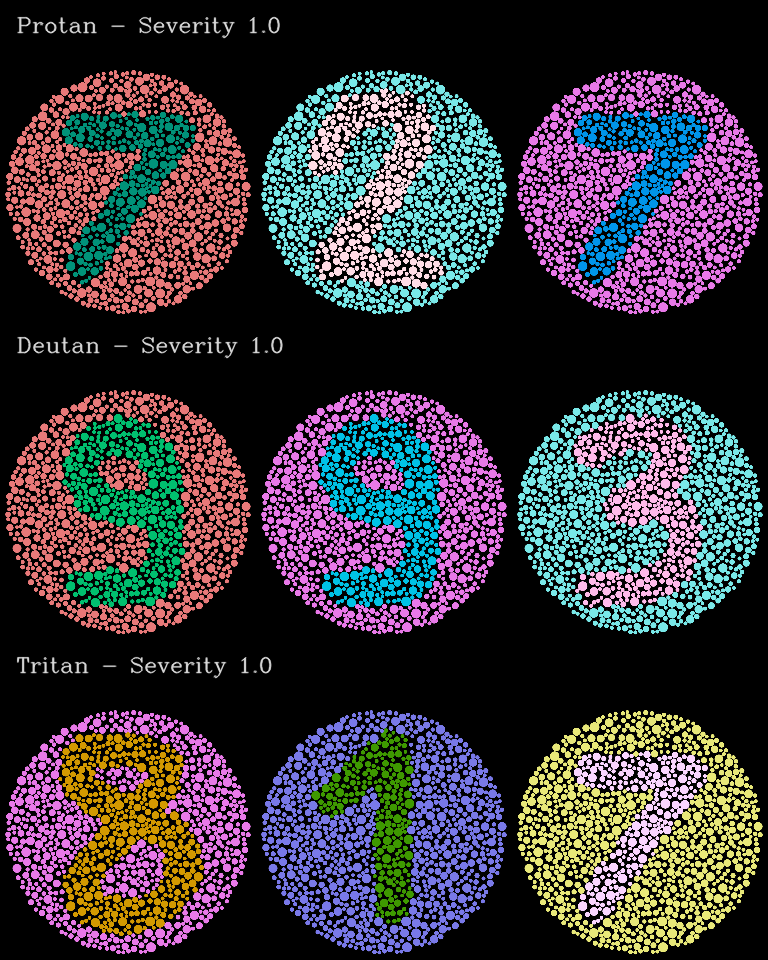
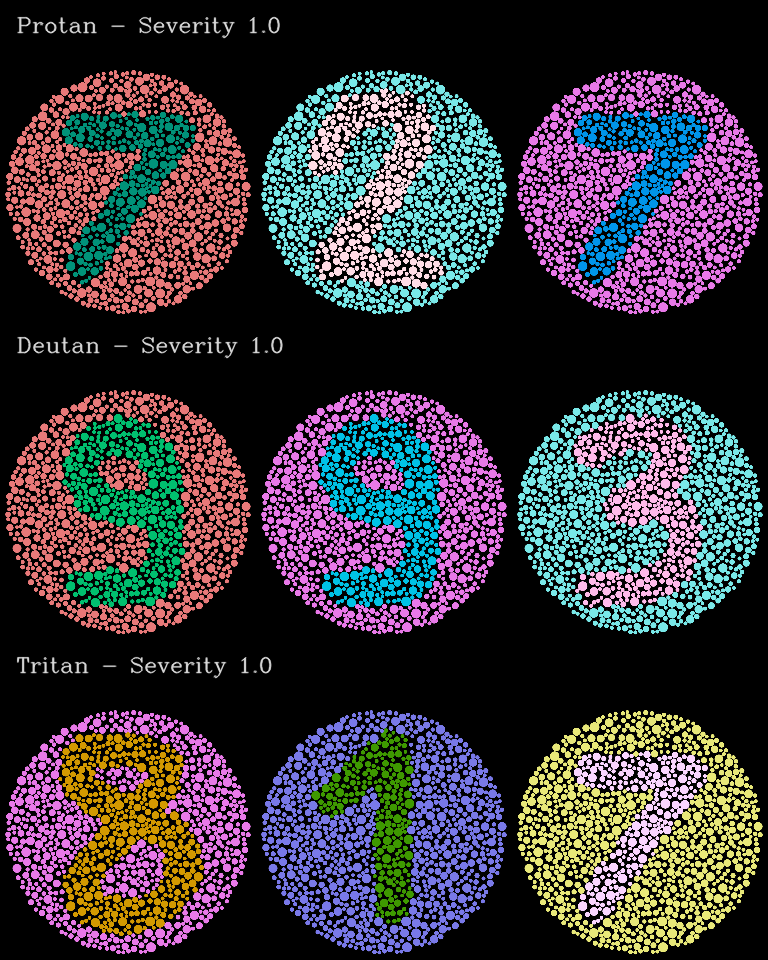
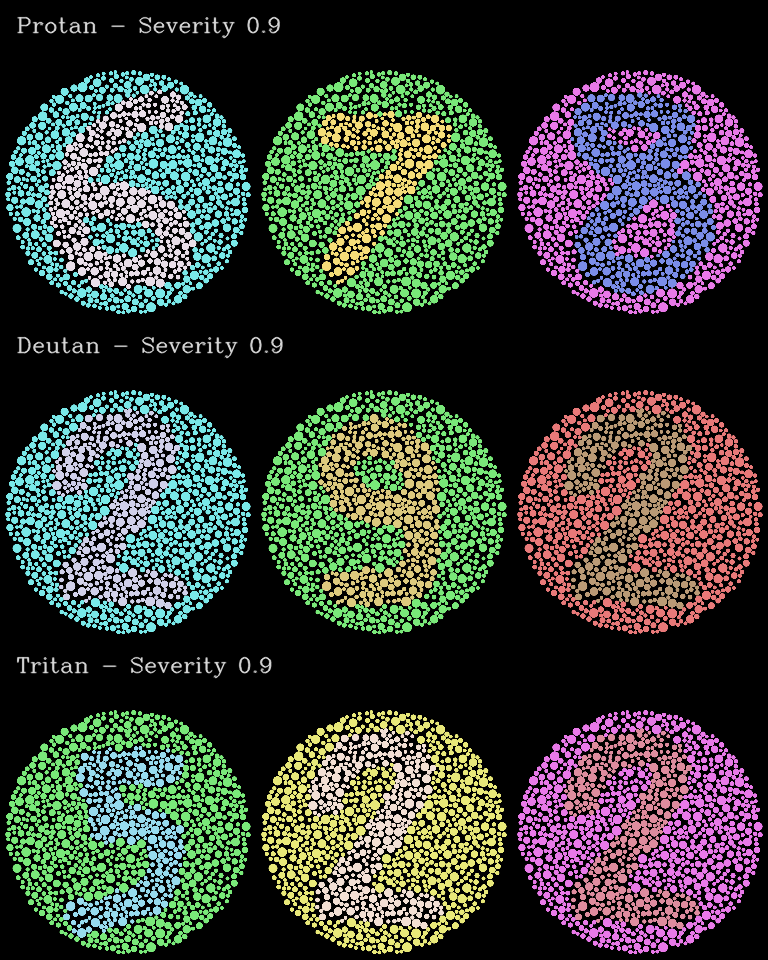
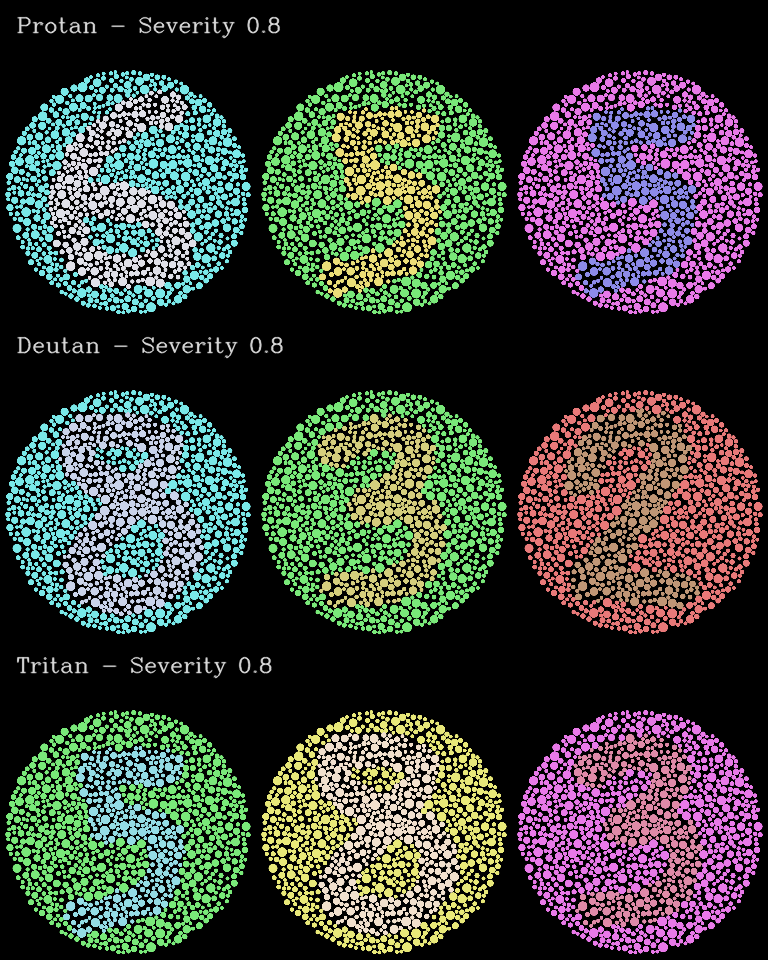
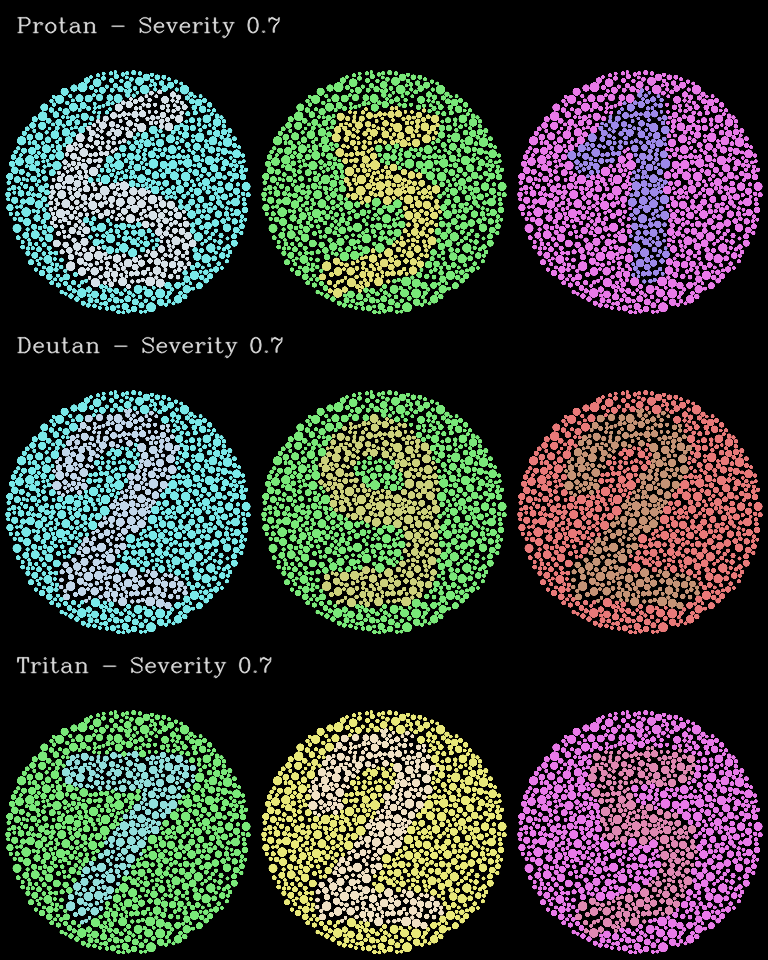
...
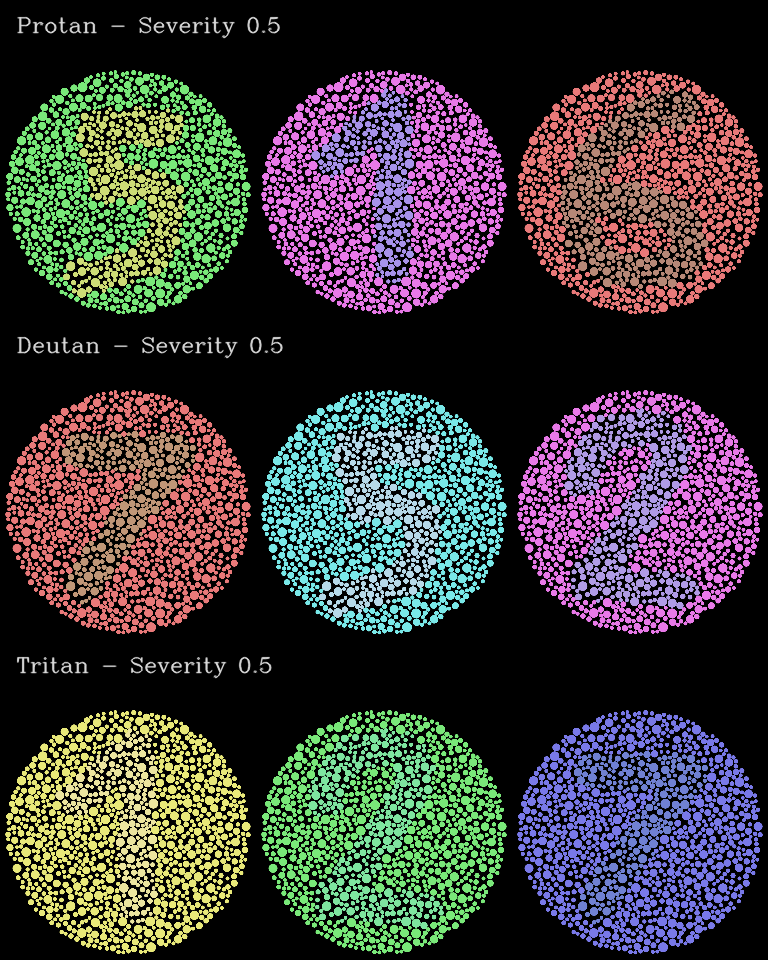
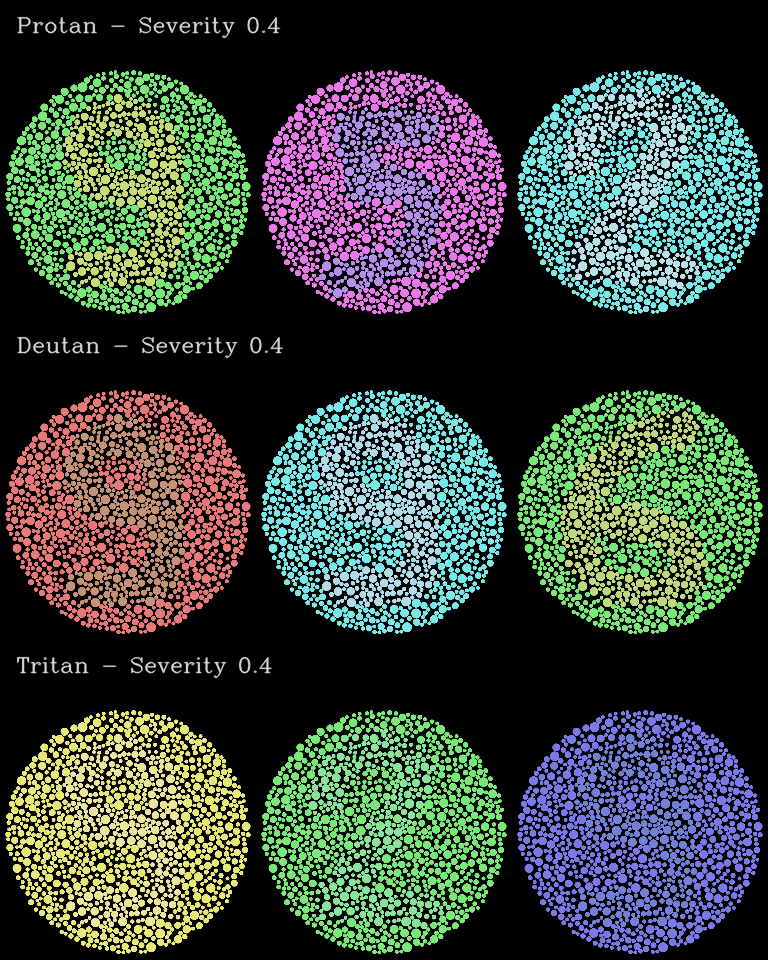
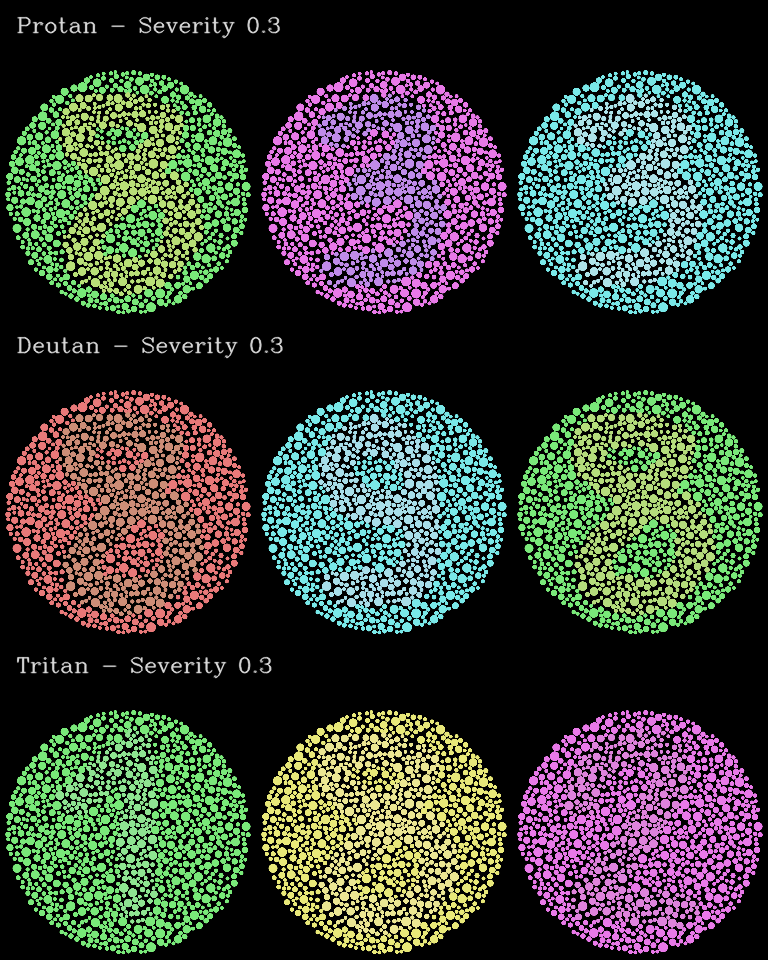
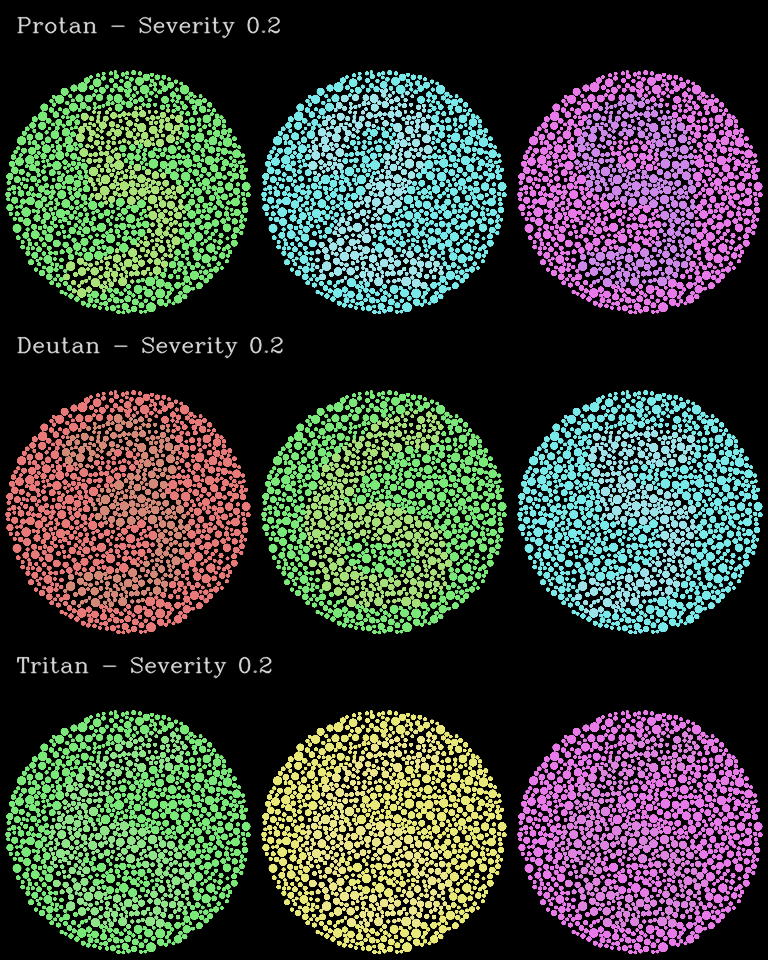
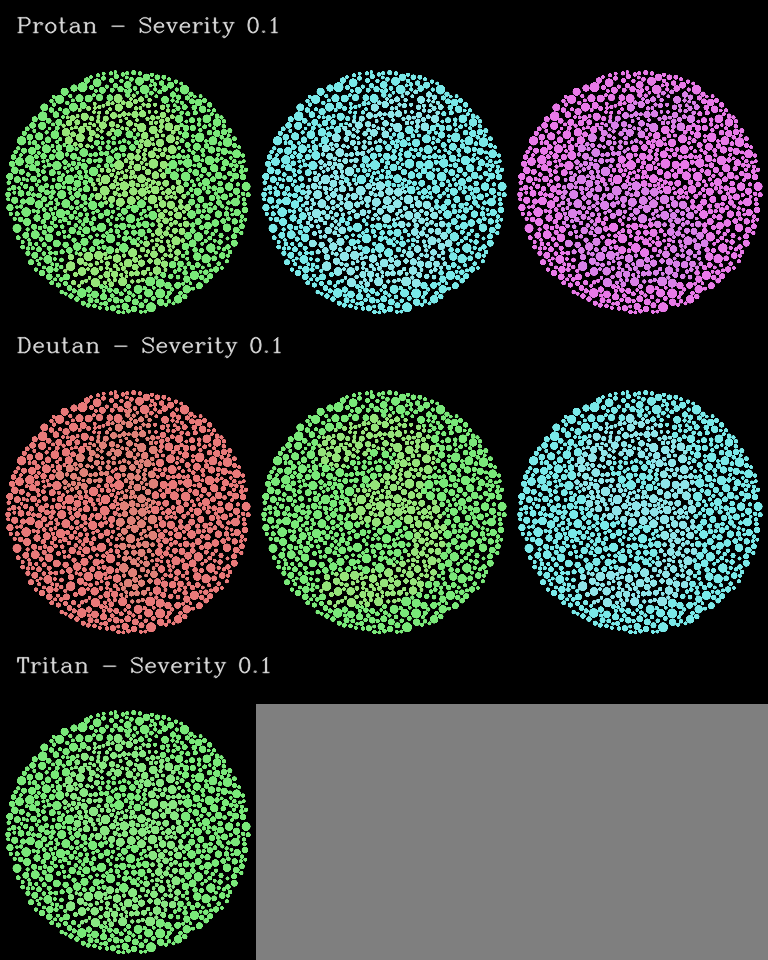

In [4]:
# collapse-hide
# This cell defines all our imports and a few utilities
import daltonlens.generate as generate
import daltonlens.simulate as simulate
import numpy as np
import plotly.express as px
import plotly.graph_objs as go
from plotly.subplots import make_subplots

# Utility for plotly imshow
hide_image_axes = dict(yaxis_visible=False, yaxis_showticklabels=False, xaxis_visible=False, xaxis_showticklabels=False, margin=dict(l=0, r=0, b=0, t=0))

def showAnimatedImages(simulator: simulate.Simulator, title: str, include_tritan: bool):
    deficiencies = {
        simulate.Deficiency.PROTAN: 'Protan',
        simulate.Deficiency.DEUTAN: 'Deutan',
    }
    # Only Brettel is expected to give realistic Tritan simulation
    if include_tritan:
        deficiencies.update({ simulate.Deficiency.TRITAN: 'Tritan' })
    images = []
    for severity in np.arange(1.0, 0.09, -0.1):
        severity_images = []
        for deficiency, deficiency_name in deficiencies.items():
            im = generate.simulator_ishihara_plate(simulator, deficiency, severity, f"{deficiency_name} - Severity {severity:.1f}")
            severity_images.append (im)
        images.append(np.vstack(severity_images))
    images = np.stack(images, axis=0)
    fig = px.imshow(images, height=704*1.4, animation_frame=0, title=title).update_layout(hide_image_axes).update_layout(margin=None)
    fig.show()

showAnimatedImages(simulate.Simulator_Brettel1997(), 'Brettel 1997', include_tritan=True)
showAnimatedImages(simulate.Simulator_Vienot1999(),  'Viénot 1999',  include_tritan=True)
showAnimatedImages(simulate.Simulator_Machado2009(), 'Machado 2009', include_tritan=True)

I'll use my perception to give an example. With the 3 models I can read some numbers on the protan row at severity 1.0 (with difficulty though), but I definitely can't read any number on that row at severity 0.8 / 0.9. However I can still read some numbers on the deutan plates at severity 0.3/0.4, and some numbers on the tritan plates at severity 0.1/0.2. This would make me a mild/strong protan. It's expected that the deutan row also gives some difficulties since the L and M cone responses are very close and lead to similar kind of deficiencies (same projection plane in the LMS space). Because of that ambiguity I regularly get some online tests to wrongly classify me as a deutan.

A person with normal vision will typically be able to read some numbers on every row even at severity 0.1, but with difficulty and probably not all of them as the colors are barely above the "just noticeable difference" at that level.

Of course these experiments just give us some hints. One of the main problem with CVD simulations is that the severity varies with the size of the objects. So the shape of the numbers and the size of the circles matter. The more we rely on edge detection, the harder it'll be to discriminate adjacent colors. On that matter [this article by Rob Pike](https://commandcenter.blogspot.com/2020/09/color-blindness-is-inaccurate-term.html) is an interesting read about edge perception and color blindness.

Your feedback with these plates is welcome, especially if you have some kind of CVD!

# Bibliography

{% bibliography --cited %}

In [5]:
#hide
# The cell above will show a nice bibliography in the HTML output.